In [ ]:
import os
import json
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
from PIL import Image
import numpy as np
from pprint import pprint
import cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.models import load_model
import time
from google.colab.patches import cv2_imshow
from IPython.display import HTML
from base64 import b64encode

Model input shape: (None, 256, 512, 3)
Video properties: 30 FPS, 1148x644
Processed 100 frames. Average FPS: 8.47
Processed 200 frames. Average FPS: 8.80
Processed 300 frames. Average FPS: 8.87
Processed 400 frames. Average FPS: 9.12
Processed 500 frames. Average FPS: 8.83
End of video stream or error reading frame
Video processing complete. Total frames: 564
Average FPS: 8.85


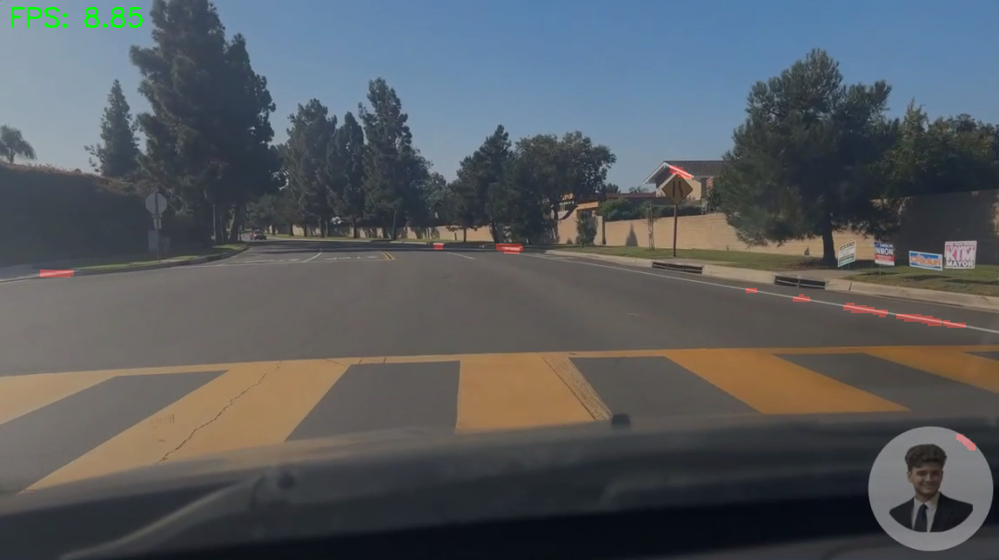

In [ ]:
# Load the trained model
model_path = 'big_model.keras'
if not os.path.exists(model_path):
    raise FileNotFoundError(f"Model file not found: {model_path}")

model = load_model(model_path)
print(f"Model input shape: {model.input_shape}")

# Open the video file
video_path = '/content/clip13.mp4'
if not os.path.exists(video_path):
    raise FileNotFoundError(f"Video file not found: {video_path}")

video = cv2.VideoCapture(video_path)

if not video.isOpened():
    raise IOError("Error opening video file")

# Get video properties
fps = int(video.get(cv2.CAP_PROP_FPS))
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
print(f"Video properties: {fps} FPS, {width}x{height}")

# Define the codec and create VideoWriter object
output_path = 'output.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

total_frames = 0
start_time = time.time()

while True:
    ret, frame = video.read()
    if not ret:
        print("End of video stream or error reading frame")
        break

    # Resize and preprocess the frame
    processed_frame = cv2.resize(frame, (512, 256))
    processed_frame = processed_frame / 255.0  # Normalize
    processed_frame = np.expand_dims(processed_frame, axis=0)

    # Predict using the model
    prediction = model.predict(processed_frame, verbose=0)[0]

    # Post-process the prediction
    lane_mask = (prediction > 0.5).astype(np.uint8) * 255  # Binary mask

    # Resize the lane mask to match the original frame size
    lane_mask_resized = cv2.resize(lane_mask, (width, height), interpolation=cv2.INTER_NEAREST)

    # Create a color mask with red color where the lanes are detected
    colored_lanes = np.zeros_like(frame)
    colored_lanes[lane_mask_resized == 255] = [0, 0, 255]

    # Apply morphological operations
    kernel_size = 5
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    lane_mask_closed = cv2.morphologyEx(lane_mask_resized, cv2.MORPH_CLOSE, kernel)
    lane_mask_dilated = cv2.dilate(lane_mask_closed, kernel, iterations=1)

    # Create the final colored mask
    colored_lanes = np.zeros_like(frame)
    colored_lanes[lane_mask_dilated == 255] = [0, 0, 255]

    # Overlay the colored mask onto the original frame
    result = cv2.addWeighted(frame, 0.7, colored_lanes, 0.3, 0)

    # Calculate and display FPS
    total_frames += 1
    elapsed_time = time.time() - start_time
    fps_current = total_frames / elapsed_time
    cv2.putText(result, f"FPS: {fps_current:.2f}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX,
                1, (0, 255, 0), 2)

    # Write the frame to the output video
    out.write(result)

    # Print progress every 100 frames
    if total_frames % 100 == 0:
        print(f"Processed {total_frames} frames. Average FPS: {fps_current:.2f}")

video.release()
out.release()

print(f"Video processing complete. Total frames: {total_frames}")
print(f"Average FPS: {total_frames / elapsed_time:.2f}")

# Display the last processed frame
cv2_imshow(result)

# Play the output video in the cell
def show_local_mp4_video(file_path, width=640):
    """
    Display a local MP4 video in an IPython notebook cell.
    """
    # Convert the video to base64 string
    mp4 = open(file_path, 'rb').read()
    data_url = f"data:video/mp4;base64,{b64encode(mp4).decode()}"

    # Create HTML to display the video
    return HTML(f"""
    <video width="{width}" controls>
        <source src="{data_url}" type="video/mp4">
    </video>
    """)

In [ ]:
# Display the video
show_local_mp4_video(output_path)